In [1]:
import tensorflow as tf
import math
import numpy as np
import matplotlib.pyplot as plt
from random import shuffle

from tensorflow.python.tools import freeze_graph
from tensorflow.python.tools import optimize_for_inference_lib
import time


print("Tensorflow version " + tf.__version__)
tf.set_random_seed(0)

Tensorflow version 1.13.0-rc1


In [2]:
# Pour convertir le temp du format sec* à hh:mm:ss
def elapsed(sec):
    if sec<60:
        return str(sec) + " sec"
    elif sec<(60*60):
        return str(sec/60) + " min"
    else:
        return str(sec/(60*60)) + " hr"

In [2]:
Taille_Sample = 40

# Load training and eval data
Data_Marche_Train = np.loadtxt("Marche_Train.txt") 
Data_Course_Train = np.loadtxt("Course_Train.txt") 
Data_Arriere_Train = np.loadtxt("Arriere_Train.txt")
print(Data_Marche_Train)
print(Data_Marche_Train[0])
print(Data_Marche_Train[1])
print(Data_Marche_Train[2])
Labels_Marche_Train = np.zeros(int(Data_Marche_Train.shape[0]/40),)     #label "0"pour la marche de taille du tenseur
Labels_Course_Train = np.ones(int(Data_Course_Train.shape[0]/40),)      #label "1"pour la course
Labels_Arriere_Train = np.ones(int(Data_Arriere_Train.shape[0]/40),)*2  #label "2"pour le train

print ("Features Marche_Train.shape: ",Data_Marche_Train.reshape(int(Data_Marche_Train.shape[0]/40),40,3, 1).shape, "Labels Marche: ",Labels_Marche_Train.shape)
print ("Features Course_Train.shape: ",Data_Course_Train.reshape(int(Data_Course_Train.shape[0]/40),40,3, 1).shape, "Labels Course: ",Labels_Course_Train.shape)
print ("Features Arriere_Train.shape: ",Data_Arriere_Train.reshape(int(Data_Arriere_Train.shape[0]/40),40,3, 1).shape, "Labels Arriere: ",Labels_Arriere_Train.shape)

#--------------------------------------------------------------------------#

Data_Marche_Test = np.loadtxt("Marche_Test.txt") 
print ("\nData_Marche_Test.shape", Data_Marche_Test.shape)
Data_Course_Test = np.loadtxt("Course_Test.txt") 
print ("Data_Marche_Test.shape", Data_Marche_Test.shape)
Data_Arriere_Test = np.loadtxt("Arriere_Test.txt") 
print ("Data_Arriere_Test.shape: ",Data_Arriere_Test.shape)

Labels_Marche_Test = np.zeros(int(Data_Marche_Test.shape[0]/40),)     #label "0"pour la marche
print ("\nLabels_Marche_Test.shape", Labels_Marche_Test.shape)
Labels_Course_Test = np.ones(int(Data_Course_Test.shape[0]/40),)      #label "1"pour la course
print ("Labels_Course_Test.shape", Labels_Course_Test.shape)
Labels_Arriere_Test = np.ones(int(Data_Arriere_Test.shape[0]/40),)*2  #label "2"pour le train
print ("Labels_Arriere_Test.shape", Labels_Arriere_Test.shape)

print ("\nFeatures Test Marche.shape: ",Data_Marche_Test.shape, "Labels Test Marche.shape: ",Labels_Marche_Test.shape)
print ("Features Test Course.shape: ",Data_Course_Test.shape, "Labels Test Course.shape: ",Labels_Course_Test.shape)
print ("Features TestArriere.shape: ",Data_Arriere_Test.shape, "Labels Test Arriere.shape: ",Labels_Arriere_Test.shape)

#----------------------------------------------------------------------------------#
#ajouter à la suite de "data_Marche_train" les valeurs de "data_course_train" ensuite les valeurs de "Data_Arriere_train"
#le même traitement est également fait sur les labels
features = np.append(Data_Marche_Train,Data_Course_Train, axis=0)  
features = np.append(features,Data_Arriere_Train, axis=0)
labels = np.append(Labels_Marche_Train,Labels_Course_Train, axis=0)
labels = np.append(labels,Labels_Arriere_Train, axis=0)
features = features.reshape(int(features.shape[0]/40),40,3, 1)
print("\nFeatures et Labels Train: ",features.shape, labels.shape)

print("\nlabels_train")
print(labels)

features_test = np.append(Data_Marche_Test,Data_Course_Test, axis=0)
features_test = np.append(features_test,Data_Arriere_Test, axis=0)
labels_test = np.append(Labels_Marche_Test,Labels_Course_Test, axis=0)
labels_test = np.append(labels_test,Labels_Arriere_Test, axis=0)
features_test = features_test.reshape(int(features_test.shape[0]/40),40,3, 1)
print("\nFeatures et Labels Test: ",features_test.shape, labels_test.shape)

print("\nlabels_test")
print(labels_test)



[[ -7.        31.       -10.142858]
 [ -6.        31.       -12.857142]
 [ -5.        28.       -15.214286]
 ...
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]]
[ -7.        31.       -10.142858]
[ -6.        31.       -12.857142]
[ -5.        28.       -15.214286]
Features Marche_Train.shape:  (325, 40, 3, 1) Labels Marche:  (325,)
Features Course_Train.shape:  (142, 40, 3, 1) Labels Course:  (142,)
Features Arriere_Train.shape:  (117, 40, 3, 1) Labels Arriere:  (117,)

Data_Marche_Test.shape (3360, 3)
Data_Marche_Test.shape (3360, 3)
Data_Arriere_Test.shape:  (1240, 3)

Labels_Marche_Test.shape (84,)
Labels_Course_Test.shape (54,)
Labels_Arriere_Test.shape (31,)

Features Test Marche.shape:  (3360, 3) Labels Test Marche.shape:  (84,)
Features Test Course.shape:  (2160, 3) Labels Test Course.shape:  (54,)
Features TestArriere.shape:  (1240, 3) Labels Test Arriere.shape:  (31,)

Features et Labels Train:  (584, 40, 3, 1) (584

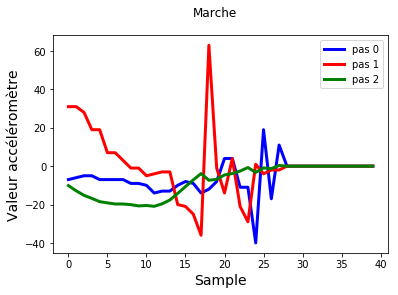

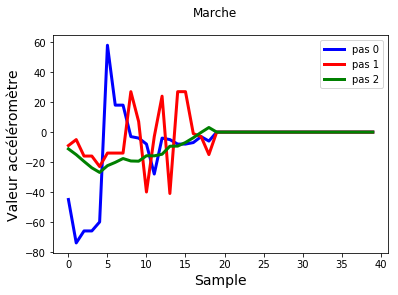

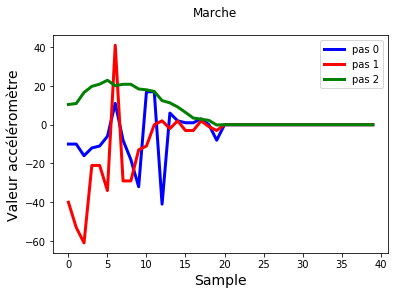

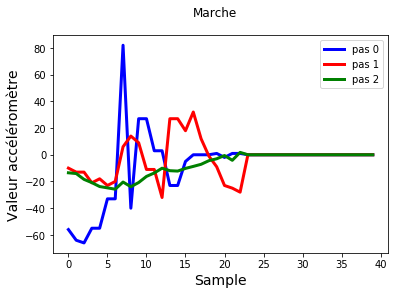

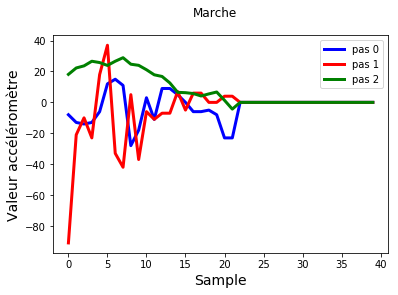

...

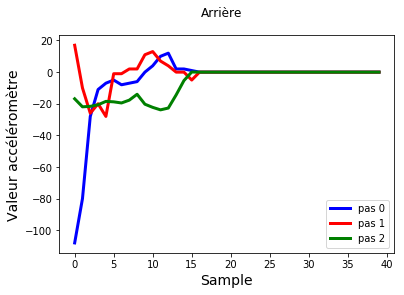

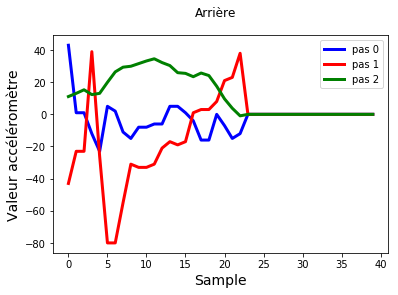

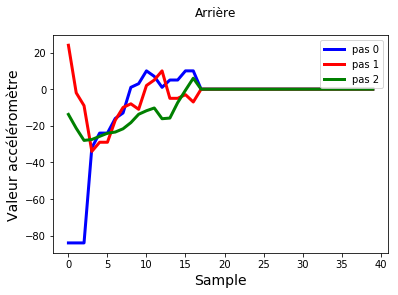

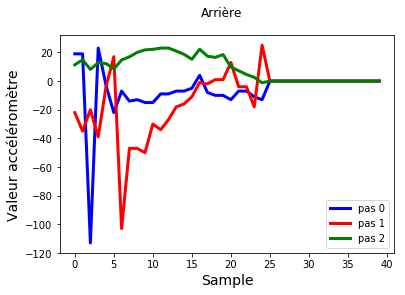

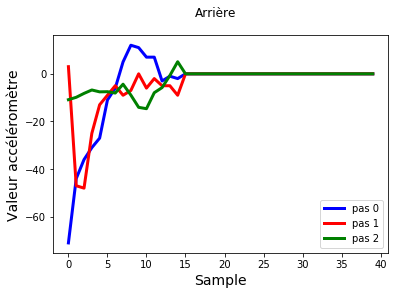

IndexError: index 584 is out of bounds for axis 0 with size 584

In [3]:

for i in range (700):
    Pas = features[i,:]

    fig, axes = plt.subplots(1)
    if (labels[i]==0): 
        fig.suptitle('Marche')
    elif(labels[i]==1): 
        fig.suptitle('Course')
    elif(labels[i]==2): 
        fig.suptitle('Arrière')
    axes.set_ylabel("Valeur accéléromètre", fontsize=14)
    axes.set_xlabel("Sample", fontsize=14)
    axes.plot(Pas[:,0],color='blue', lw=3, label='pas 0')
    axes.plot(Pas[:,1],color='red', lw=3, label='pas 1')
    axes.plot(Pas[:,2],color='green', lw=3, label='pas 2')
    axes.legend()
    plt.show()


##### * __https://www.tensorflow.org/tutorials/estimators/cnn__

Instructions for updating:
Use keras.layers.conv2d instead.
Instructions for updating:
Colocations handled automatically by placer.
 Epoch : 0  Loss:  1.4523311 Test_Loss:  1.5243303
 Accuracy:  0.19178082 Accuracy Test:  0.17159763
 Epoch : 1  Loss:  1.1526196 Test_Loss:  1.3648564
 Accuracy:  0.5565069 Accuracy Test:  0.49704143
 Epoch : 2  Loss:  2.6968358 Test_Loss:  2.518256
 Accuracy:  0.32363012 Accuracy Test:  0.34319526
 Epoch : 3  Loss:  1.5122408 Test_Loss:  1.5084952
 Accuracy:  0.24486302 Accuracy Test:  0.3195266
 Epoch : 4  Loss:  1.0846418 Test_Loss:  1.1011626
 Accuracy:  0.5650685 Accuracy Test:  0.52662724
 Epoch : 5  Loss:  0.9907683 Test_Loss:  1.0074492
 Accuracy:  0.60102737 Accuracy Test:  0.556213
 Epoch : 6  Loss:  0.90714234 Test_Loss:  0.9315799
 Accuracy:  0.6626712 Accuracy Test:  0.62721896
 Epoch : 7  Loss:  0.81909597 Test_Loss:  0.8542289
 Accuracy:  0.7020548 Accuracy Test:  0.6745562
 Epoch : 8  Loss:  0.7385651 Test_Loss:  0.7826866
 Accuracy:  0.72

 Epoch : 76  Loss:  0.06197957 Test_Loss:  0.22415522
 Accuracy:  0.98630136 Accuracy Test:  0.93491125
 Epoch : 77  Loss:  0.0601968 Test_Loss:  0.26322752
 Accuracy:  0.989726 Accuracy Test:  0.9112426
 Epoch : 78  Loss:  0.058966618 Test_Loss:  0.22168495
 Accuracy:  0.9880137 Accuracy Test:  0.92899406
 Epoch : 79  Loss:  0.05712998 Test_Loss:  0.26659873
 Accuracy:  0.989726 Accuracy Test:  0.9112426
 Epoch : 80  Loss:  0.055971954 Test_Loss:  0.22192462
 Accuracy:  0.9880137 Accuracy Test:  0.92899406
 Epoch : 81  Loss:  0.05414154 Test_Loss:  0.26689807
 Accuracy:  0.9914383 Accuracy Test:  0.9112426
 Epoch : 82  Loss:  0.05285265 Test_Loss:  0.22528388
 Accuracy:  0.989726 Accuracy Test:  0.92899406
 Epoch : 83  Loss:  0.051197417 Test_Loss:  0.26424477
 Accuracy:  0.99486303 Accuracy Test:  0.9112426
 Epoch : 84  Loss:  0.050049175 Test_Loss:  0.22823781
 Accuracy:  0.989726 Accuracy Test:  0.92899406
 Epoch : 85  Loss:  0.0486046 Test_Loss:  0.2642157
 Accuracy:  0.99486303 A

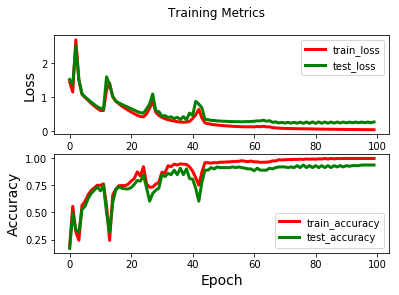

In [5]:
# Initialize placeholders
x = tf.placeholder(dtype=tf.float32, shape=[None, Taille_Sample, 3, 1], name="input")
y = tf.placeholder(dtype=tf.int32, shape=[None], name="label")
step = tf.placeholder(dtype=tf.int32)

# First convolution layer
conv1 = tf.layers.conv2d(inputs= x,filters=16, kernel_size=4, padding="SAME",strides=[1,1], activation=tf.nn.relu)
conv2 = tf.layers.conv2d(inputs= conv1,filters=32, kernel_size=3, padding="SAME",strides=[1,1], activation=tf.nn.relu)
pool1 = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 1, 1, 1], padding="SAME", name="pool1")
# Second convolution layer
conv3 = tf.layers.conv2d(inputs= pool1,filters=64, kernel_size=4, padding="SAME",strides=[1,1], activation=tf.nn.relu)
conv4 = tf.layers.conv2d(inputs= conv3,filters=33, kernel_size=3, padding="SAME",strides=[1,1], activation=tf.nn.relu)
pool2 = tf.nn.max_pool(conv4, ksize=[1, 2, 2, 1], strides=[1, 1, 1, 1], padding="SAME", name="pool2")

shape = pool2.get_shape().as_list()
reshaped = tf.reshape(pool2, shape=[-1, shape[1] * shape[2] * shape[3]])
# First convolution layer
dense1 = tf.contrib.layers.fully_connected(reshaped, 1000 ,activation_fn=tf.nn.relu,scope='Dense1')
# Fully connected layer
dense2 = tf.contrib.layers.fully_connected(dense1, 500 ,activation_fn=tf.nn.relu,scope='Dense2')
dense3 = tf.contrib.layers.fully_connected(dense2, 100 ,activation_fn=tf.nn.relu,scope='Dense3')
dense4 = tf.contrib.layers.fully_connected(dense3, 30 ,activation_fn=tf.nn.relu,scope='Dense4')
# Final softmax layer
logits = tf.contrib.layers.fully_connected(dense4, 4 ,activation_fn=None,scope='Dense5')
softmax = tf.nn.softmax(logits, name = "final_result")  #normalise les valeurs dans l'intervalle [0, 1]

#dense1 = add_dense_hidden_layer_op(x=reshaped, num_neurons_previous_layer=50*2, num_neurons_current_layer=200, name_scope="dense1")
#dense2 = add_dense_hidden_layer_op(x=dense1, num_neurons_previous_layer=200, num_neurons_current_layer=100, name_scope="dense2")
#dense3 = add_dense_hidden_layer_op(x=dense2, num_neurons_previous_layer=100, num_neurons_current_layer=60, name_scope="dense3")
#dense4 = add_dense_hidden_layer_op(x=dense3, num_neurons_previous_layer=60, num_neurons_current_layer=30, name_scope="dense4")
#softmax, logits = add_softmax_op(x=dense4, num_neurons_previous_layer=30, num_classes=2, name_scope="softmax")


with tf.name_scope("Loss"):
    # Calcul de la fonction de coût
    loss = tf.reduce_mean( tf.nn.sparse_softmax_cross_entropy_with_logits (labels = y, 
                                                                    logits = logits,name="cross_entropy"))
    
with tf.name_scope("Train"):
    # La fonction d'optimisation
    lr = 0.0001 + tf.train.exponential_decay(0.01, step, 3000, 1/math.e) #
    train_op = tf.train.GradientDescentOptimizer(learning_rate= lr).minimize(loss)
    
with tf.name_scope("accuracy"):
    # Trouve l'indice de la sortie la plus élevée, donc le label prédit
    pred = tf.argmax(softmax, 1, name = "out")
    # Calcul le taux de prédiction correct
    correct_prediction = tf.equal(tf.cast(pred, tf.int32), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32), name = "accuracy_value")
 
# L'opérateur qui permet de sauvegarder le modèle
saver = tf.train.Saver()

## Note: Rerunning this cell uses the same model variables
train_loss_results = []
test_loss_results = []
train_accuracy_results = []
test_accuracy_results = []

#start time training
start_time = time.time()

# Ouverture de la Session TensorFlow
sess = tf.Session()
# Initialisation des variables du modèle
sess.run(tf.global_variables_initializer())


# La boucle d'entrainement
for i in range(100):
    # On appel les opérateurs des différentes métriques
    train_loss_val, train_accuracy_val= sess.run([loss, accuracy], feed_dict={x: features, y: labels})
    
    # On récupère le taux de prédiction sur les données test
    test_accuracy_val,test_loss_val = sess.run([accuracy,loss], feed_dict={x: features_test, y: labels_test})
    
    # On appel l'opérateur d'entrainement
    sess.run(train_op, feed_dict={x: features, y: labels, step: i})

    print(" Epoch :", i," Loss: ", train_loss_val,"Test_Loss: ", test_loss_val)
    print(" Accuracy: ", train_accuracy_val,"Accuracy Test: ",test_accuracy_val)
    train_loss_results.append(train_loss_val)
    test_loss_results.append(test_loss_val)
    train_accuracy_results.append(train_accuracy_val)
    test_accuracy_results.append(test_accuracy_val)
    
print("Elapsed time: ", elapsed(time.time() - start_time))
meta_graph_def = tf.train.export_meta_graph(filename='./Model.meta')
# Plot the evolution of loss and train accuracy
fig, axes = plt.subplots(2)
fig.suptitle('Training Metrics')
fig.figsize=(14,8)

axes[0].set_ylabel("Loss", fontsize=14)
axes[0].plot(train_loss_results,color='red', lw=3, label='train_loss')
axes[0].plot(test_loss_results,color='green', lw=3, label='test_loss')
axes[0].legend()

axes[1].set_ylabel("Accuracy", fontsize=14)
axes[1].set_xlabel("Epoch", fontsize=14)
axes[1].plot(train_accuracy_results,color='red', lw=3, label='train_accuracy')
axes[1].plot(test_accuracy_results,color='green', lw=3, label='test_accuracy')
axes[1].legend()
plt.show()


In [ ]:
# Sauvegarde les variables du modèle sous forme de checkpoint (.ckpt)
saver.save(sess, './running_model.ckpt')
# Sauvegarde le graphe du modèle sous forme de Graph_Def
tf.train.write_graph(sess.graph_def, ".", 'running_model.pbtxt')

# Ce sont les nom et adresse, et valeurs que l'on vas utiliser dans les script d'optimisations du modèle
MODEL_NAME = 'running_model'
input_graph_path = MODEL_NAME+'.pbtxt'
checkpoint_path = './'+MODEL_NAME+'.ckpt'
input_saver_def_path = ""
input_binary = False
output_node_names = "final_result"
restore_op_name = "save/restore_all"
filename_tensor_name = "save/Const:0"
output_frozen_graph_name = 'frozen_'+MODEL_NAME+'.pb'
output_optimized_graph_name = 'optimized_'+MODEL_NAME+'.pb'
clear_devices = True

# Permet de geler le graphe, 
freeze_graph.freeze_graph(input_graph_path, input_saver_def_path,
                         input_binary, checkpoint_path,output_node_names,
                         restore_op_name,filename_tensor_name,
                         output_frozen_graph_name,clear_devices,"")

# Ouvre et charge le fichier du modèle gelé
input_graph_def = tf.GraphDef()
with tf.gfile.Open(output_frozen_graph_name,"rb") as f:
    data = f.read()
    input_graph_def.ParseFromString(data)

# Permet d'appliquer des optimisations au modèle
output_graph_def = optimize_for_inference_lib.optimize_for_inference(input_graph_def,
                                                                    ["input"],
                                                                    ["final_result"],
                                                                    tf.float32.as_datatype_enum)
# On écrit et on sauvegarde les modifications dans un nouveau fichier
f = tf.gfile.FastGFile(output_optimized_graph_name,"w")
f.write(output_graph_def.SerializeToString())

In [ ]:
'''
x = tf.placeholder(dtype=tf.float32, shape=[None,3], name="input")
y = tf.placeholder(dtype=tf.int32, shape=[None], name="label")

dense1 = tf.contrib.layers.fully_connected(x, 4 ,activation_fn=tf.nn.relu,scope='Dense1')
dense2 = tf.contrib.layers.fully_connected(dense1, 3 ,activation_fn=tf.nn.relu,scope='Dense2')
dense3 = tf.contrib.layers.fully_connected(dense1, 4 ,activation_fn=tf.nn.softmax,scope='Softmax')
'''

In [ ]:
start_time = time.time()
a=0
for i in range (len(labels_test)):
    # Affichage des tableaux qui récapitulent la variation des métriques durant l'entrainement
    label_prédit, softmax_val = sess.run([pred, softmax], feed_dict={x: features_test[i].reshape(1,Taille_Sample,3,1)})
    if (labels_test[i] != label_prédit):
        print("\x1b[31m Sample:",i, "Label Actuel:", labels_test[i], "Label Prédit:", label_prédit[0], "\x1b[0m")
        a=a+1
        #fig, axes = plt.subplots(1)

        #axes.plot(features_test[i,:,:,0])
        #plt.show()

print("Elapsed time: ", elapsed(time.time() - start_time))
print("Nbr_predict_errors: ",a)
Pourcentage_loss = (a*100)/labels_test.shape[0]
Pourcentage_win  = 100 - (a*100)/labels_test.shape[0]
print("labels_test.Shape: ",labels_test.shape,"loss:",Pourcentage_loss,"% Win:",Pourcentage_win,"%")